In [3]:
import tensorflow as tf
device_name=tf.test.gpu_device_name

# if device_name != '/device:GPU:0':
#    raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: <function gpu_device_name at 0x7f6c22f66a70>


In [4]:
pip install -q transformers

     |████████████████████████████████| 4.0 MB 12.1 MB/s 
     |████████████████████████████████| 77 kB 2.9 MB/s 
     |████████████████████████████████| 596 kB 35.6 MB/s 
     |████████████████████████████████| 6.6 MB 42.2 MB/s 
     |████████████████████████████████| 895 kB 41.6 MB/s 


In [5]:
import torch
from torch.utils.data import RandomSampler , DataLoader , TensorDataset , SequentialSampler
from keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from transformers import BertTokenizer ,BertConfig
from transformers import AdamW , BertForSequenceClassification ,get_linear_schedule_with_warmup

In [6]:
from tqdm import tqdm, trange
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt

In [7]:
#title Specify CUDA as device for Torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

n_gpu = torch.cuda.device_count()
torch.cuda.get_device_name(0)

'Tesla K80'

##**open Dataset**

In [8]:
df=pd.read_csv('taghche.csv'  )
          
df.shape

(69829, 6)

In [9]:
df.head()

,date,comment,bookname,rate,bookID,like
0,1395/11/14,اسم کتاب No one writes to the Colonel\nترجمش...,سرهنگ کسی ندارد برایش نامه بنویسد,0.0,3.0,2.0
1,1395/11/14,"طاقچه عزیز،نام کتاب""کسی به سرهنگ نامه نمینویسد...",سرهنگ کسی ندارد برایش نامه بنویسد,5.0,3.0,2.0
2,1394/06/06,بنظرم این اثر مارکز خیلی از صد سال تنهایی که ب...,سرهنگ کسی ندارد برایش نامه بنویسد,5.0,3.0,0.0
3,1393/09/02,به نظر کتاب خوبی میومد اما من از ترجمش خوشم نی...,سرهنگ کسی ندارد برایش نامه بنویسد,2.0,3.0,0.0
4,1393/06/29,کتاب خوبی است,سرهنگ کسی ندارد برایش نامه بنویسد,3.0,3.0,0.0


In [10]:
df.columns

Index(['date', 'comment', 'bookname', 'rate', 'bookID', 'like'], dtype='object')

##**Visulaizing Data**

In [11]:
pip install chart-studio

     |████████████████████████████████| 64 kB 2.3 MB/s 
  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11447 sha256=b76a3c5569457f9bf2c262eef48646da0c928be2832f217e42cd11dd43eb47f9
  Stored in directory: /root/.cache/pip/wheels/f9/8d/8d/f6af3f7f9eea3553bc2fe6d53e4b287dad18b06a861ac56ddf
Successfully built retrying


In [12]:
from chart_studio import plotly
from chart_studio import plotly as py

In [13]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

In [14]:
from plotly.offline import init_notebook_mode, iplot

configure_plotly_browser_state()
# 
# import plotly.plotly as py

from wordcloud import WordCloud
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from textblob import TextBlob 

# import plotly.plotly as py
from plotly import tools
import seaborn as sns
import pandas as pd
import string, os, random



init_notebook_mode(connected=True)

punc = string.punctuation

In [15]:
df=df.dropna()

In [16]:
df['word_count'] = df['comment'].apply(lambda x : len(x.split()))
df['char_count'] = df['comment'].apply(lambda x : len(x.replace(" ","")))
df['word_density'] = df['word_count'] / (df['char_count'] + 1)
df['punc_count'] = df['comment'].apply(lambda x : len([a for a in x if a in punc]))

df[['word_count', 'char_count', 'word_density', 'punc_count']].head(10)

,word_count,char_count,word_density,punc_count
0,48,189,0.252632,1
1,13,76,0.168831,2
2,40,172,0.231214,4
3,19,69,0.271429,0
4,3,11,0.250000,0
5,5,22,0.217391,1
6,11,43,0.250000,0
7,32,143,0.222222,5
8,27,116,0.230769,0
9,15,56,0.263158,1


In [17]:
df['month'] = df['date'].apply(lambda x : str(x)[5:7])
df['day'] = df['date'].apply(lambda x : str(x)[8:])
df['Year'] = df['date'].apply(lambda x : str(x)[0:4])


df[[ 'month', 'day', 'Year']].tail(10)

,month,day,Year
69819,09,01,1398
69820,09,01,1398
69821,09,01,1398
69822,08,29,1398
69823,08,30,1398
69824,06,13,1398
69825,06,16,1398
69826,05,26,1398
69827,09,29,1398
69828,07,24,1398


In [18]:
xwords = df.word_count
trace1 = go.Histogram(x=xwords, opacity=0.65, name="Word Count", marker=dict(color='rgba(171, 50, 96, 0.6)'))
data = [trace1]
layout = go.Layout(barmode='overlay',
                   title='Word Count of Comments',
                   xaxis=dict(title='Word Count'),
                   yaxis=dict( title='Numer of Comments'))
fig = go.Figure(data=data, layout=layout)
fig.show(renderer="colab")



In [19]:
xchars = df.char_count
trace1 = go.Histogram(x=xchars, opacity=0.65, name="Word Count", marker=dict(color='rgba(12, 50, 196, 0.6)'))
data = [trace1]
layout = go.Layout(barmode='overlay',
                   title='Char Count of Comments',
                   xaxis=dict(title='Char Count'),
                   yaxis=dict( title='Numer of Comments'))
fig = go.Figure(data=data, layout=layout)
# iplot(fig)
fig.show(renderer="colab")


In [20]:
xwd = df.word_density
trace1 = go.Histogram(x=xwd, opacity=0.65, name="Word Count", marker=dict(color='rgba(0, 0, 0, 0.6)'))
data = [trace1]
layout = go.Layout(barmode='overlay',
                   title='Word Density of Comments',
                   xaxis=dict(title='Word Density'),
                   yaxis=dict( title='Numer of Comments'))
fig = go.Figure(data=data, layout=layout)
# iplot(fig)
fig.show(renderer="colab")


In [21]:
xpc = df.punc_count
trace1 = go.Histogram(x=xpc, opacity=0.75, name="Word Count", marker=dict(color='rgba(10, 220, 150, 0.6)'))
data = [trace1]
layout = go.Layout(barmode='overlay',
                   title='Punctuation Count of Comments',
                   xaxis=dict(title='Punctuation Count'),
                   yaxis=dict( title='Numer of Comments'))
fig = go.Figure(data=data, layout=layout)
# iplot(fig)
fig.show(renderer="colab")


In [22]:
xpc = df.like
trace1 = go.Histogram(x=xpc, opacity=0.75, name="Word Count", marker=dict(color='rgba(10, 220, 150, 0.6)'))
data = [trace1]
layout = go.Layout(barmode='overlay',
                   title='Like Count of Comments',
                   xaxis=dict(title='Like Count'),
                   yaxis=dict( title='Numer of Comments'))
fig = go.Figure(data=data, layout=layout)
# iplot(fig)
fig.show(renderer="colab")

In [23]:
xpc = df.bookname
trace1 = go.Histogram(x=xpc, opacity=0.75, name="Word Count", marker=dict(color='rgba(10, 220, 150, 0.6)'))
data = [trace1]
layout = go.Layout(barmode='overlay',
                   title='book Count ',
                   xaxis=dict(title='Like Count'),
                   yaxis=dict( title='Numer of Comments'))
fig = go.Figure(data=data, layout=layout)
# iplot(fig)
fig.show(renderer="colab")

In [24]:
def create_stack_bar_data(col):
    aggregated = df[col].value_counts()
    x_values = aggregated.index.tolist()
    y_values = aggregated.values.tolist()
    return x_values, y_values

In [25]:
x1, y1 = create_stack_bar_data('month')
trace1 = go.Bar(x=x1, y=y1, opacity=0.75, name="month", marker=dict(color='rgba(10, 220, 150, 0.6)'))

x2, y2 = create_stack_bar_data('day');
trace2 = go.Bar(x=x2, y=y2, opacity=0.75, name="month-date", marker=dict(color='rgba(0, 20, 50, 0.6)'));

fig = tools.make_subplots(rows=1, cols=2, print_grid=False);
fig.append_trace(trace1, 1, 1);
fig.append_trace(trace2, 1, 2);

fig['layout'].update(height=400, title='Month and Month-Day comment counts', legend=dict(orientation="h"));
# iplot(fig, filename='simple-subplot');
fig.show(renderer="colab")


/usr/local/lib/python3.7/dist-packages/plotly/tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [27]:
xpc = df.rate
trace1 = go.Histogram(x=xpc, opacity=0.75, name="Word Count", marker=dict(color='rgba(10, 220, 150, 0.6)'))
data = [trace1]
layout = go.Layout(barmode='overlay',
                   title='Rate Count ',
                   xaxis=dict(title='Rate'),
                   yaxis=dict( title='Numer of Comments'))
fig = go.Figure(data=data, layout=layout)
# iplot(fig)
fig.show(renderer="colab")

In [28]:
import random
def balance_rate_count(df):
    ls_5rate=df[df['rate'] ==5].index
    r_index=random.choices(ls_5rate,k=10000)
    new_df= df.loc[r_index, :]
    df.drop(ls_5rate, axis=0, inplace=True)
    ls_0rate=df[df['rate'] ==0].index
    df.drop(ls_0rate, axis=0, inplace=True)
    return pd.concat([df,new_df])


    

In [29]:
df_balanced=balance_rate_count(df)

In [30]:
df_balanced.shape

(38088, 13)

#**Preprocessing**





In [31]:
pip install  parsivar

     |████████████████████████████████| 36.2 MB 272 kB/s 
     |████████████████████████████████| 1.5 MB 36.2 MB/s 
  Created wheel for parsivar: filename=parsivar-0.2.3-py3-none-any.whl size=36492972 sha256=46e106790a4324087a5f7b3ebe5f2c30195e5b30282a412965c10f88eab34d0b
  Stored in directory: /root/.cache/pip/wheels/ae/67/7a/49cbf08f64d3f76a26eceaf0e481a40e233f05d4356875cbed
  Created wheel for nltk: filename=nltk-3.4.5-py3-none-any.whl size=1449921 sha256=d857a62621ff78143e722bbc02c9ef9b09a945d8a7af22fff7af8bf7ec1eb52e
  Stored in directory: /root/.cache/pip/wheels/48/8b/7f/473521e0c731c6566d631b281f323842bbda9bd819eb9a3ead
Successfully built parsivar nltk
  Attempting uninstall: nltk
    Found existing installation: nltk 3.2.5
    Uninstalling nltk-3.2.5:
      Successfully uninstalled nltk-3.2.5


In [32]:
from parsivar import *
import re

In [33]:
def remove_emoji(text): 
    emoji_pattern = re.compile("["
                u"\U0001F600-\U0001F64F"  # emoticons
                u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                u"\U0001F680-\U0001F6FF"  # transport & map symbols
                u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                u"\U00002702-\U000027B0"
                u"\U000024C2-\U0001F251"
                u"\U0001f926-\U0001f937"
                u'\U00010000-\U0010ffff'
                u"\u200d"
                u"\u200c"
                u"\u2640-\u2642"
                u"\u2600-\u2B55"
                u"\u23cf"
                u"\u23e9"
                u"\u231a"
                u"\u3030"
                u"\ufe0f"
    "]+", flags=re.UNICODE)
    
    return emoji_pattern.sub(r' ', text)
def remove_link(text): 
    return re.sub(r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', '', str(text))

def remove_tabs(text): 
    return re.sub(r'[\n\r\t]', '', str(text))

def remove_email(text): 
    return re.sub(r'\S+@\S+', '', str(text))

def remove_englishword(text): 
    return re.sub(r'[A-Za-z0-9]+', '', str(text))

def remove_extranewlines(text):
    return re.sub(r'\n\n+', '\n\n', text)

In [34]:
df_balanced.drop('date', axis=1, inplace=True)
df_balanced.drop('bookID', axis=1 , inplace=True)
df_balanced=df_balanced[~df_balanced['comment'].isnull()]
df_balanced=df_balanced.reset_index()
def preprocess(text):
    text=remove_emoji(text)
    text=remove_link(text)
    text=remove_tabs(text)
    text=remove_extranewlines(text)
    return text
df_balanced['preprocessed'] =[  preprocess(df_balanced['comment'][i]) for i in range(df_balanced.shape[0]) ]

In [35]:
df_balanced.shape

(38088, 13)

In [36]:
np.unique(df_balanced['rate'],return_counts=True)

(array([1., 2., 3., 4., 5.]), array([ 7930,  3794,  7008,  9356, 10000]))

In [37]:
def rate_to_label(rate, threshold=3.0):
    if rate <= threshold:
        return 'negative'
    else:
        return 'positive'


df_balanced['label'] = df_balanced['rate'].apply(lambda t: rate_to_label(t, 3.0))
labels = list(sorted(df_balanced['label'].unique()))
df_balanced.head()

,index,comment,bookname,rate,like,word_count,char_count,word_density,punc_count,month,day,Year,preprocessed,label
0,3,به نظر کتاب خوبی میومد اما من از ترجمش خوشم نی...,سرهنگ کسی ندارد برایش نامه بنویسد,2.0,0.0,19,69,0.271429,0,09,02,1393,به نظر کتاب خوبی میومد اما من از ترجمش خوشم نی...,negative
1,4,کتاب خوبی است,سرهنگ کسی ندارد برایش نامه بنویسد,3.0,0.0,3,11,0.250000,0,06,29,1393,کتاب خوبی است,negative
2,5,راستش خیلی خوشم نیومد ازش!,سرهنگ کسی ندارد برایش نامه بنویسد,3.0,0.0,5,22,0.217391,1,05,02,1393,راستش خیلی خوشم نیومد ازش!,negative
3,7,"هر هشت تای این داستانها توی کتاب ""بهترین داستا...",هشت داستان کوتاه,3.0,1.0,32,143,0.222222,5,09,30,1398,"هر هشت تای این داستانها توی کتاب ""بهترین داستا...",negative
4,8,سلام چرا این نمونه نداره که بدونیم کدوم داستان...,هشت داستان کوتاه,1.0,1.0,27,116,0.230769,0,12,02,1393,سلام چرا این نمونه نداره که بدونیم کدوم داستان...,negative


In [38]:
def rate_to_label(rate, threshold=3.0):
    if rate <= threshold:
        return 0
    else:
        return 1


df_balanced['label_id'] = df_balanced['rate'].apply(lambda t: rate_to_label(t, 3.0))
labels = list(sorted(df_balanced['label'].unique()))
df_balanced.head()

,index,comment,bookname,rate,like,word_count,char_count,word_density,punc_count,month,day,Year,preprocessed,label,label_id
0,3,به نظر کتاب خوبی میومد اما من از ترجمش خوشم نی...,سرهنگ کسی ندارد برایش نامه بنویسد,2.0,0.0,19,69,0.271429,0,09,02,1393,به نظر کتاب خوبی میومد اما من از ترجمش خوشم نی...,negative,0
1,4,کتاب خوبی است,سرهنگ کسی ندارد برایش نامه بنویسد,3.0,0.0,3,11,0.250000,0,06,29,1393,کتاب خوبی است,negative,0
2,5,راستش خیلی خوشم نیومد ازش!,سرهنگ کسی ندارد برایش نامه بنویسد,3.0,0.0,5,22,0.217391,1,05,02,1393,راستش خیلی خوشم نیومد ازش!,negative,0
3,7,"هر هشت تای این داستانها توی کتاب ""بهترین داستا...",هشت داستان کوتاه,3.0,1.0,32,143,0.222222,5,09,30,1398,"هر هشت تای این داستانها توی کتاب ""بهترین داستا...",negative,0
4,8,سلام چرا این نمونه نداره که بدونیم کدوم داستان...,هشت داستان کوتاه,1.0,1.0,27,116,0.230769,0,12,02,1393,سلام چرا این نمونه نداره که بدونیم کدوم داستان...,negative,0


#**Implementation of Classifier**

In [39]:
sentences=df_balanced.comment.values
sentences=["[CLS] " + sentence + " [SEP]" for sentence in sentences]

labels=df_balanced.label_id.values

In [40]:
sentences[0]

'[CLS] به نظر کتاب خوبی میومد اما من از ترجمش خوشم نیومد، لحنش طوری نبود که کتابو تا آخر بخونم [SEP]'

In [41]:
tokenizer = BertTokenizer.from_pretrained('bert-base-multilingual-uncased' ,do_lower_case=True)
tokenized_texts=[tokenizer.tokenize(sent) for sent in sentences]
print ("Tokenize the first sentence:")
print (tokenized_texts[0])

Downloading:   0%|          | 0.00/851k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/625 [00:00<?, ?B/s]

Tokenize the first sentence:
['[CLS]', 'به', 'نظر', 'کتاب', 'خ', '##وبی', 'می', '##وم', '##د', 'اما', 'من', 'از', 'تر', '##جم', '##ش', 'خ', '##وش', '##م', 'نیو', '##مد', '،', 'ل', '##حن', '##ش', 'طور', '##ی', 'ن', '##بود', 'که', 'کتاب', '##و', 'تا', 'اخر', 'ب', '##خ', '##ون', '##م', '[SEP]']


In [42]:
MAX_LEN=128
input_ids=[tokenizer.convert_tokens_to_ids(x) for x in tokenized_texts]
input_ids=pad_sequences(input_ids , maxlen=MAX_LEN , dtype='long' , truncating='post' , padding='post')

In [43]:
attention_masks=[]
for seq in input_ids:
    seq_mask=[float(i>0) for i in seq]
    attention_masks.append(seq_mask)

In [44]:
len(input_ids)

38088

In [50]:
#title Splitting data into train and validation sets
# Use train_test_split to split our data into train and validation sets for training
train_inputs1, test_inputs, train_labels, test_labels = train_test_split(input_ids,
                                                                                    labels, random_state=2018, test_size=0.1)
train_inputs, validation_inputs, train_labels, validation_labels = train_test_split(train_inputs1,
                                                                                    train_labels, random_state=2018, test_size=0.1)
train_masks, test_masks, _, _ = train_test_split(attention_masks,
input_ids,random_state=2018, test_size=0.1)

train_masks, validation_masks, _, _ = train_test_split(train_masks, 
                                                       train_inputs1,random_state=2018, test_size=0.1)

In [52]:
#title Converting all the data into torch tensors
# Torch tensors are the required datatype for our model
train_inputs= torch.tensor(train_inputs)
validation_inputs=torch.tensor(validation_inputs)
test_inputs=torch.tensor(test_inputs)
train_labels= torch.tensor(train_labels)
validation_labels= torch.tensor(validation_labels)
test_labels= torch.tensor(test_labels)

train_masks= torch.tensor(train_masks)
validation_masks= torch.tensor(validation_masks)
test_masks= torch.tensor(test_masks)


In [53]:
#title Selecting a Batch Size and Creating and Iterator
# Select a batch size for training. For fine-tuning BERT on a specific task, the authors recommend a batch size of 16 or 32
batch_size = 32

# Create an iterator of our data with torch DataLoader. This helps save on memory during training because, unlike a for loop,
# with an iterator the entire dataset does not need to be loaded into memory
train_data = TensorDataset(train_inputs, train_masks,train_labels)
train_sampler=RandomSampler( train_data )

train_dataloader=DataLoader(train_data, sampler=train_sampler , batch_size=batch_size)



validation_data = TensorDataset(validation_inputs, validation_masks,validation_labels)
validation_sampler=SequentialSampler( validation_data )

validation_dataloader=DataLoader(validation_data, sampler=validation_sampler , batch_size=batch_size)

In [54]:
try:
    import transformers
except:
    print("Installing transformers")
    !pip -qq install transformers

In [55]:
from transformers import BertModel,BertConfig 
configuration=BertConfig()
model=BertModel(configuration)
configuration = model.config
print(configuration)

BertConfig {
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.18.0",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}



In [56]:
#title Loading Hugging Face Bert uncased base model
model = BertForSequenceClassification.from_pretrained("bert-base-multilingual-uncased", num_labels=2)
model.cuda()

Downloading:   0%|          | 0.00/641M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-multilingual-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model 

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(105879, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elemen

In [57]:
param_optimizer = list(model.named_parameters())
no_decay = ['bias', 'LayerNorm.weight']

In [58]:
opitimizer_grouped_parameters = [{'params':[p for n,p in param_optimizer if not any(nd in  n for nd in no_decay)],'weight_decay_rate':0.1}
                                 
                                 ,{'params':[p for n,p in param_optimizer if  any(nd in n  for nd in no_decay)],'weight_decay_rate':0}]

In [62]:

# Number of training epochs (authors recommend between 2 and 4)
epochs = 6

optimizer = AdamW(opitimizer_grouped_parameters ,
                  lr = 2e-5, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                  eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                  )
# Total number of training steps is number of batches * number of epochs.
# `train_dataloader` contains batched data so `len(train_dataloader)` gives 
# us the number of batches.
total_steps = len(train_dataloader) * epochs

# Create the learning rate scheduler.
scheduler = get_linear_schedule_with_warmup(optimizer, 
                                            num_warmup_steps = 0, # Default value in run_glue.py
                                            num_training_steps = total_steps)


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning:

This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning



In [60]:


#Creating the Accuracy Measurement Function
# Function to calculate the accuracy of our predictions vs labels
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)



In [63]:
t = [] 

# Store our loss and accuracy for plotting
train_loss_set = []

# trange is a tqdm wrapper around the normal python range
for _ in trange(epochs, desc="Epoch"):
  
  
  # Training
  
  # Set our model to training mode (as opposed to evaluation mode)
  model.train()
  
  # Tracking variables
  tr_loss = 0
  nb_tr_examples, nb_tr_steps = 0, 0
  
  # Train the data for one epoch
  for step, batch in enumerate(train_dataloader):
    # Add batch to GPU
    batch = tuple(t.to(device) for t in batch)
    # Unpack the inputs from our dataloader
    b_input_ids, b_input_mask, b_labels = batch
    # Clear out the gradients (by default they accumulate)
    optimizer.zero_grad()
    # Forward pass
    outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)
    loss = outputs['loss']
    train_loss_set.append(loss.item())    
    # Backward pass
    loss.backward()
    # Update parameters and take a step using the computed gradient
    optimizer.step()

    # Update the learning rate.
    scheduler.step()
    
    
    # Update tracking variables
    tr_loss += loss.item()
    
    nb_tr_examples += b_input_ids.size(0)
    nb_tr_steps += 1

  print("Train loss: {}".format(tr_loss/nb_tr_steps))
    
    
  # Validation

  # Put model in evaluation mode to evaluate loss on the validation set
  model.eval()

  # Tracking variables 
  eval_loss, eval_accuracy = 0, 0
  nb_eval_steps, nb_eval_examples = 0, 0

  # Evaluate data for one epoch
  for batch in validation_dataloader:
    # Add batch to GPU
    batch = tuple(t.to(device) for t in batch)
    # Unpack the inputs from our dataloader
    b_input_ids, b_input_mask, b_labels = batch
    # Telling the model not to compute or store gradients, saving memory and speeding up validation
    with torch.no_grad():
      # Forward pass, calculate logit predictions
      logits = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask)
    
    # Move logits and labels to CPU
    logits = logits['logits'].detach().cpu().numpy()
    label_ids = b_labels.to('cpu').numpy()

    tmp_eval_accuracy = flat_accuracy(logits, label_ids)
    
    eval_accuracy += tmp_eval_accuracy
    nb_eval_steps += 1

  print("Validation Accuracy: {}".format(eval_accuracy/nb_eval_steps))

Epoch:   0%|          | 0/6 [00:00<?, ?it/s]

Train loss: 0.42601938829829655


Epoch:  17%|█▋        | 1/6 [20:22<1:41:52, 1222.45s/it]

Validation Accuracy: 0.7618634259259259
Train loss: 0.37060155593669475


Epoch:  33%|███▎      | 2/6 [40:44<1:21:29, 1222.35s/it]

Validation Accuracy: 0.7566550925925926
Train loss: 0.30649950027156986


Epoch:  50%|█████     | 3/6 [1:01:07<1:01:07, 1222.40s/it]

Validation Accuracy: 0.7511574074074074
Train loss: 0.24289708066480764


Epoch:  67%|██████▋   | 4/6 [1:21:28<40:44, 1222.03s/it]  

Validation Accuracy: 0.7502893518518519
Train loss: 0.18953868487531347


Epoch:  83%|████████▎ | 5/6 [1:41:50<20:21, 1221.88s/it]

Validation Accuracy: 0.7505787037037037
Train loss: 0.1583706532889697


Epoch: 100%|██████████| 6/6 [2:02:10<00:00, 1221.81s/it]

Validation Accuracy: 0.7450810185185185


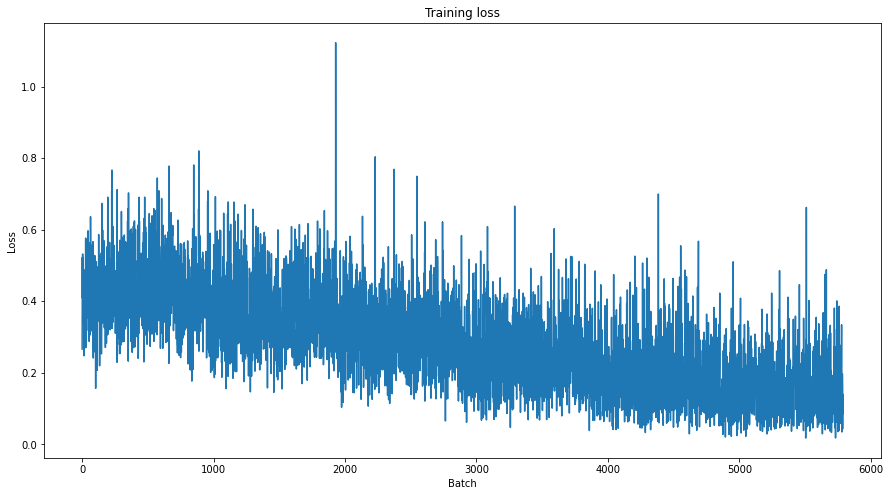

In [64]:
#title Training Evaluation
plt.figure(figsize=(15,8))
plt.title("Training loss")
plt.xlabel("Batch")
plt.ylabel("Loss")
plt.plot(train_loss_set)
plt.show()


In [65]:
# #title Predicting and Evaluating Using the Hold-out Dataset 


  
batch_size = 32  


prediction_data = TensorDataset(test_inputs, test_masks, test_labels)
prediction_sampler = SequentialSampler(prediction_data)
prediction_dataloader = DataLoader(prediction_data, sampler=prediction_sampler, batch_size=batch_size)


In [84]:
# Prediction on test set

# Put model in evaluation mode
model.eval()

# Tracking variables 
predictions , true_labels = [], []
nb_eval_steps = 0
eval_accuracy = 0
# Predict 
for batch in prediction_dataloader:
  # Add batch to GPU
  batch = tuple(t.to(device) for t in batch)
  # Unpack the inputs from our dataloader
  b_input_ids, b_input_mask, b_labels = batch
  # Telling the model not to compute or store gradients, saving memory and speeding up prediction
  with torch.no_grad():
    # Forward pass, calculate logit predictions
    logits = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask)

  # Move logits and labels to CPU
  logits = logits['logits'].detach().cpu().numpy()
  label_ids = b_labels.to('cpu').numpy()
  
  # Store predictions and true labels
  predictions.append(logits)
  true_labels.append(label_ids)
  tmp_eval_accuracy = flat_accuracy(logits, label_ids)
  

  eval_accuracy += tmp_eval_accuracy
  nb_eval_steps += 1

print("Test Accuracy: {}".format(eval_accuracy/nb_eval_steps))

Test Accuracy: 0.75


In [79]:

#title Evaluating Using Matthew's Correlation Coefficient
# Import and evaluate each test batch using Matthew's correlation coefficient
from sklearn.metrics import matthews_corrcoef
matthews_set = []

for i in range(len(true_labels)):
  matthews = matthews_corrcoef(true_labels[i],
                 np.argmax(predictions[i], axis=1).flatten())
  matthews_set.append(matthews)



In [71]:
#title Matthew's Evaluation on the Whole Dataset
# Flatten the predictions and true values for aggregate Matthew's evaluation on the whole dataset
flat_predictions = [item for sublist in predictions for item in sublist]
flat_predictions = np.argmax(flat_predictions, axis=1).flatten()
flat_true_labels = [item for sublist in true_labels for item in sublist]
matthews_corrcoef(flat_true_labels, flat_predictions)

0.49733331227313426